# <B><font color=green>PREDICTING THE HEALTH OF CITY TREES</font></B>
#### GA Part-Time Data Science Final Project 
##### by Bill Ott
![](./assets/trees.jpg)

### BACKGROUND

As city populations continue to expand, urban trees play an increasingly important role for their human cohabitators. Besides [contributing to our mental well-being](http://www.bbc.com/culture/story/20170811-what-can-trees-teach-us-about-life-and-happiness), trees no doubt benefit our environment tremendously; they filter pollution, generate oxygen, and absorb rainfall. So what can we do for *them*? And where do we plant more?

Enter: *TreeCount!* Once a decade, the New York City Department of Parks and Recreation [conducts a massive tree census](https://www.fs.fed.us/blogs/volunteers-count-every-street-tree-new-york-city-0) to collect data points on each of the 650k+ street trees that exist in the five boros. The goal? To enhance and restore our urban forest. 

NYC makes the results from TreeCount! readily available online - let's take a look at the 2015 results and test a hypothesis!

### HYPOTHESIS

The tree census absolutely fascinates me. The fact that one of the largest cities on earth can even conduct such a study is amazing. And while there's certainly a novelty to it, I can't help but feel fortunate that I live in a place that sees its value. I'm excited for a future where urban planning has dictated by thorough data analysis. 

That said, the practical applications of TreeCount! got me thinking - what makes for healthy trees? I hypothesize <font color=green>conditional factors</font>, such as how well maintained a tree is, as well as <font color=green>a tree's physical location</font>, and <font color=green>the type of tree itself</font> will contribute to whether or not a tree is healthy.

### DATA FAMILIARIZATION

In [1]:
#import needed libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import folium
%matplotlib inline

In [2]:
#load the data from the csv file pulled from NYC Open Data
data = pd.read_csv('./data/2015StreetTreesCensus_TREES.csv')

#create a dataframe
trees = pd.DataFrame(data)

In [3]:
#see the shape of the dataset
trees.shape

(683788, 42)

There are over 650k trees in the city! (Ok, not all are alive, but we'll get to that in a bit...)

In [4]:
trees.head()

,created_at,tree_id,block_id,the_geom,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,...,st_assem,st_senate,nta,nta_name,boro_ct,state,Latitude,longitude,x_sp,y_sp
0,08/27/2015,180683,348711,POINT (-73.84421521958048 40.723091773924274),3,0,OnCurb,Alive,Fair,Acer rubrum,...,28,16,QN17,Forest Hills,4073900,New York,40.723092,-73.844215,1.027431e+06,202756.768749
1,09/03/2015,200540,315986,POINT (-73.81867945834878 40.79411066708779),21,0,OnCurb,Alive,Fair,Quercus palustris,...,27,11,QN49,Whitestone,4097300,New York,40.794111,-73.818679,1.034456e+06,228644.837379
2,09/05/2015,204026,218365,POINT (-73.93660770459083 40.717580740099116),3,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,50,18,BK90,East Williamsburg,3044900,New York,40.717581,-73.936608,1.001823e+06,200716.891267
3,09/05/2015,204337,217969,POINT (-73.93445615919741 40.713537494833226),10,0,OnCurb,Alive,Good,Gleditsia triacanthos var. inermis,...,53,18,BK90,East Williamsburg,3044900,New York,40.713537,-73.934456,1.002420e+06,199244.253136
4,08/30/2015,189565,223043,POINT (-73.97597938483258 40.66677775537875),21,0,OnCurb,Alive,Good,Tilia americana,...,44,21,BK37,Park Slope-Gowanus,3016500,New York,40.666778,-73.975979,9.909138e+05,182202.425999


In [5]:
#non-null row counts for each column + their data types
trees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 683788 entries, 0 to 683787
Data columns (total 42 columns):
created_at    683788 non-null object
tree_id       683788 non-null int64
block_id      683788 non-null int64
the_geom      683788 non-null object
tree_dbh      683788 non-null int64
stump_diam    683788 non-null int64
curb_loc      683788 non-null object
status        683788 non-null object
health        652172 non-null object
spc_latin     652169 non-null object
spc_common    652169 non-null object
steward       652173 non-null object
guards        652172 non-null object
sidewalk      652172 non-null object
user_type     683788 non-null object
problems      652124 non-null object
root_stone    683788 non-null object
root_grate    683788 non-null object
root_other    683788 non-null object
trnk_wire     683788 non-null object
trnk_light    683788 non-null object
trnk_other    683788 non-null object
brnch_ligh    683788 non-null object
brnch_shoe    683788 non-null object
brnch

In [6]:
#summary stats for the numeric columns
trees.describe()

,tree_id,block_id,tree_dbh,stump_diam,zipcode,cb_num,borocode,cncldist,st_assem,st_senate,boro_ct,Latitude,longitude,x_sp,y_sp
count,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,6.837880e+05,683788.000000,683788.000000,6.837880e+05,683788.000000
mean,365205.011085,313793.096236,11.279787,0.432463,10916.246044,343.505404,3.358500,29.943181,50.791583,20.615781,3.404914e+06,40.701261,-73.924060,1.005280e+06,194798.424624
std,208122.092902,114839.024312,8.723042,3.290241,651.553364,115.740601,1.166746,14.328531,18.966520,7.390844,1.175863e+06,0.090311,0.123583,3.428505e+04,32902.061114
min,3.000000,100002.000000,0.000000,0.000000,83.000000,101.000000,1.000000,1.000000,23.000000,10.000000,1.000201e+06,40.498466,-74.254965,9.133493e+05,120973.792223
25%,186582.750000,221556.000000,4.000000,0.000000,10451.000000,302.000000,3.000000,19.000000,33.000000,14.000000,3.011700e+06,40.631928,-73.980500,9.896578e+05,169515.153719
50%,366214.500000,319967.000000,9.000000,0.000000,11214.000000,402.000000,4.000000,30.000000,52.000000,21.000000,4.008100e+06,40.700612,-73.912911,1.008386e+06,194560.252497
75%,546170.250000,404624.000000,16.000000,0.000000,11365.000000,412.000000,4.000000,43.000000,64.000000,25.000000,4.103202e+06,40.762228,-73.834910,1.029991e+06,217019.571916
max,722694.000000,999999.000000,450.000000,140.000000,11697.000000,503.000000,5.000000,51.000000,87.000000,36.000000,5.032300e+06,40.912918,-73.700488,1.067248e+06,271894.092088


So, these are certainly numbers, but only two - tree_dbh (diameter of the tree) and stump_diam (diameter of the stump if it's just a stump) - can be aggregated in a meaningful way. Looks like we're going to predicting health from categorical data.

### DATA CLEAN UP

Since 'health' (what we want to predict) is only applicable to live trees, let's subset our data.

In [7]:
#filter dataframe + save it to a new one
alive = trees[trees['status']== 'Alive']

In [8]:
#define functions to manufacture comprehensive "problems" columns
def root_problems(df):
    if df['root_stone'] == 'Yes' or df['root_grate'] == 'Yes' or df['root_other'] == 'Yes':
        root_probs = 1
    else:
        root_probs = 0
    return root_probs

        
def trunk_problems(df):    
    if df['trnk_wire'] == 'Yes' or df['trnk_light'] == 'Yes' or df['trnk_other'] == 'Yes':
        trunk_probs = 1
    else:
        trunk_probs = 0
    return trunk_probs


def branch_problems(df):    
    if df['brnch_ligh'] == 'Yes' or df['brnch_shoe'] == 'Yes' or df['brnch_othe'] == 'Yes':
        branch_probs = 1
    else:
        branch_probs = 0
    return branch_probs


def tree_problems(df):
    if df['root_problems'] == 1 or df['trunk_problems'] == 1 or df['branch_problems'] == 1:
        tree_probs = 1
    else:
        tree_probs = 0
    return tree_probs

In [9]:
#apply functions to dataframe to add new "problems" columns
pd.set_option('mode.chained_assignment', None)
alive['root_problems'] = alive.apply(root_problems,axis=1)
alive['trunk_problems'] = alive.apply(trunk_problems,axis=1)
alive['branch_problems'] = alive.apply(branch_problems,axis=1)
alive['tree_problems'] = alive.apply(tree_problems,axis=1)

It will also be helpful to have dataframes for each of the health status for EDA:

In [10]:
#create three additional filtered dataframes
poor = alive[alive['health']=='Poor']
fair = alive[alive['health']=='Fair']
good = alive[alive['health']=='Good']

### EXPLORATORY DATA ANALYSIS

EDA helps with understanding the data sets a better - this gives a starting point for picking features with which to fit the model. Because the data is mostly categorical, distributions will be super valuable.

#### "Status" distribution

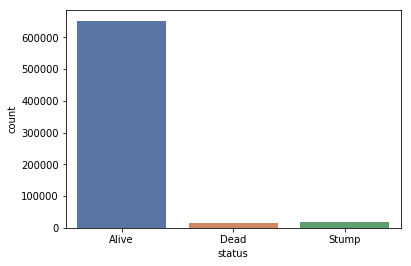

In [78]:
sns.countplot(trees['status'],palette='deep')

In [12]:
trees.status.value_counts()

Alive    652173
Stump     17654
Dead      13961
Name: status, dtype: int64

#### Health distribution

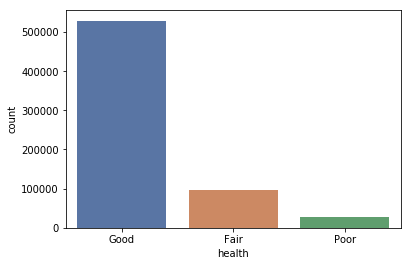

In [13]:
sns.countplot(alive['health'],order=["Good","Fair","Poor"],palette='deep')

#### Environmental features distribution

##### *Stewardship by Health*
###### (The number of signs of stewardship observed)

Text(0.5, 1.0, 'Poor')

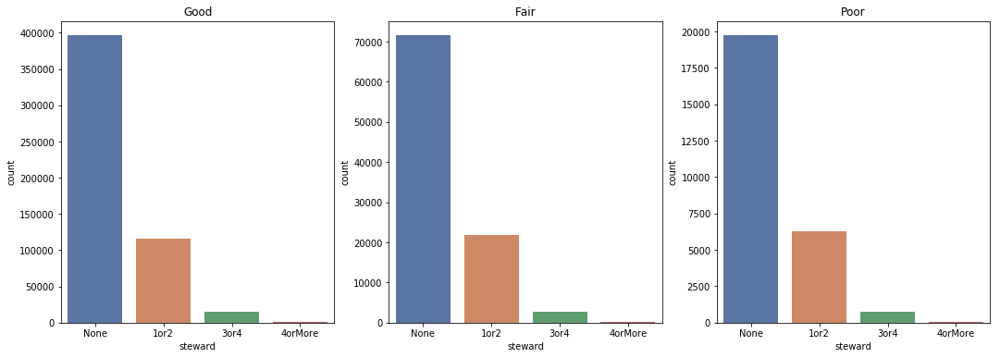

In [14]:
fig1, ax1 = plt.subplots(1,3,figsize=(18,6))
sns.countplot(good['steward'],ax=ax1[0],order=["None","1or2","3or4","4orMore"],palette="deep")
ax1[0].set_title('Good')
sns.countplot(fair['steward'],ax=ax1[1],order=["None","1or2","3or4","4orMore"],palette="deep")
ax1[1].set_title('Fair')
sns.countplot(poor['steward'],ax=ax1[2],order=["None","1or2","3or4","4orMore"],palette="deep")
ax1[2].set_title('Poor')

##### *Curb Locations by Health*
###### (Whether tree is along or offset from curb)

Text(0.5, 1.0, 'Poor')

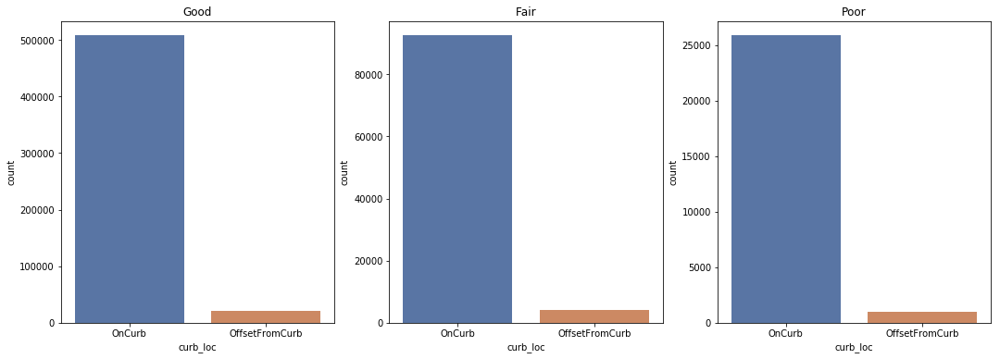

In [15]:
fig2, ax2 = plt.subplots(1,3,figsize=(18,6))
sns.countplot(good['curb_loc'],ax=ax2[0],order=["OnCurb","OffsetFromCurb"], palette='deep')
ax2[0].set_title('Good')
sns.countplot(fair['curb_loc'],ax=ax2[1],order=["OnCurb","OffsetFromCurb"], palette='deep')
ax2[1].set_title('Fair')
sns.countplot(poor['curb_loc'],ax=ax2[2],order=["OnCurb","OffsetFromCurb"], palette='deep')
ax2[2].set_title('Poor')

##### *Guard quality by Health*
###### (Presence of and type of tree guard)

Text(0.5, 1.0, 'Poor')

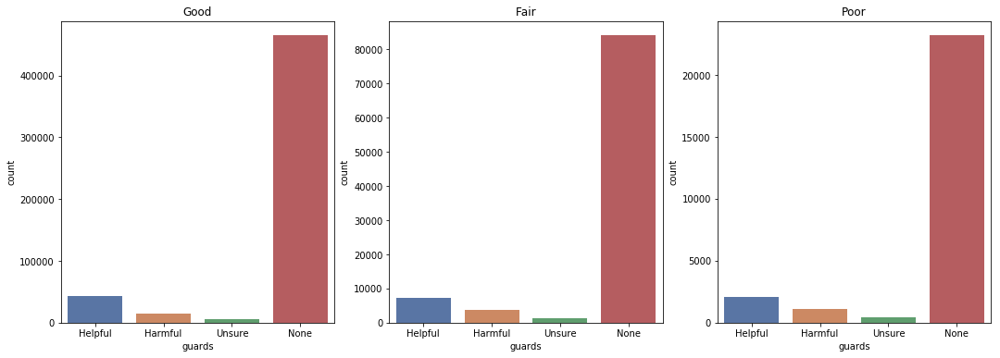

In [16]:
fig3, ax3 = plt.subplots(1,3,figsize=(18,6))
sns.countplot(good['guards'],ax=ax3[0],order=["Helpful","Harmful","Unsure","None"],palette='deep')
ax3[0].set_title('Good')
sns.countplot(fair['guards'],ax=ax3[1],order=["Helpful","Harmful","Unsure","None"],palette='deep')
ax3[1].set_title('Fair')
sns.countplot(poor['guards'],ax=ax3[2],order=["Helpful","Harmful","Unsure","None"],palette='deep')
ax3[2].set_title('Poor')

#### Species

In [17]:
print('Number of unique tree species: '+str(len(alive.spc_common.unique())))

Number of unique tree species: 133


In [18]:
alive.spc_common.unique()

array(['red maple', 'pin oak', 'honeylocust', 'American linden',
       'London planetree', 'ginkgo', 'willow oak', 'sycamore maple',
       'Amur maple', 'hedge maple', 'American elm', 'ash', 'crab apple',
       'silver maple', 'Turkish hazelnut', 'black cherry',
       'eastern redcedar', 'Norway maple', 'tulip-poplar', 'sawtooth oak',
       'Sophora', 'swamp white oak', 'Chinese fringetree',
       'southern magnolia', 'sweetgum', 'Callery pear', 'scarlet oak',
       'Atlantic white cedar', 'black oak', 'Japanese zelkova',
       'white oak', 'Ohio buckeye', 'northern red oak', 'silver linden',
       'pignut hickory', 'Kentucky yellowwood', 'mulberry', 'Douglas-fir',
       'crepe myrtle', 'sassafras', 'spruce', 'Chinese elm',
       'horse chestnut', 'holly', 'littleleaf linden', 'white pine',
       'blackgum', 'Japanese tree lilac', 'hardy rubber tree',
       'green ash', 'English oak', 'white ash', 'golden raintree',
       "Schumard's oak", 'Siberian elm', 'black walnut', 

##### *Top 10 species*
###### (for insight into how health can vary across species)

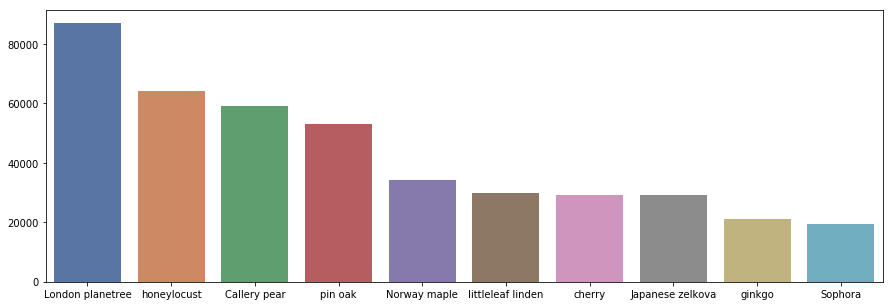

In [19]:
top_10 = alive.spc_common.value_counts().nlargest(n=10)
plt.figure(figsize=(15,5))
sns.barplot(top_10.index,top_10.values,palette='deep')
plt.show()

##### *Top 10 species - Good*

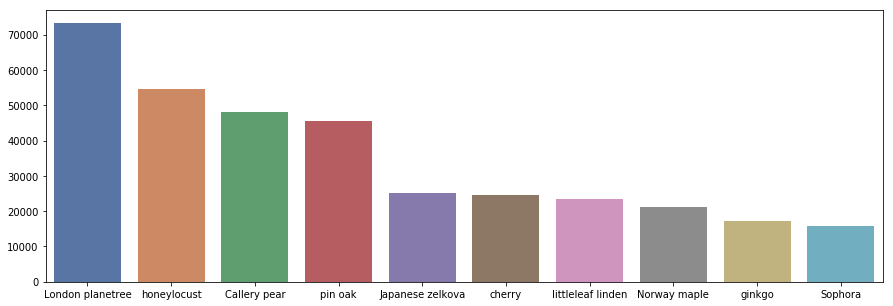

In [79]:
good_10 = good.spc_common.value_counts().nlargest(n=10)
plt.figure(figsize=(15,5))
sns.barplot(good_10.index,good_10.values,palette='deep')
plt.show()

##### *Top 10 species - Fair*

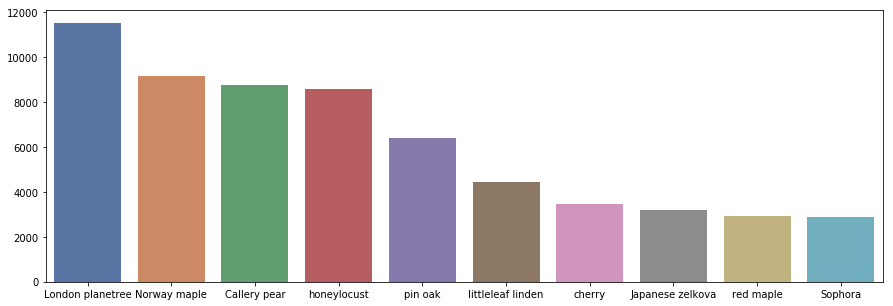

In [80]:
fair_10 = fair.spc_common.value_counts().nlargest(n=10)
plt.figure(figsize=(15,5))
sns.barplot(fair_10.index,fair_10.values,palette='deep')
plt.show()

##### *Top 10 species - Poor*

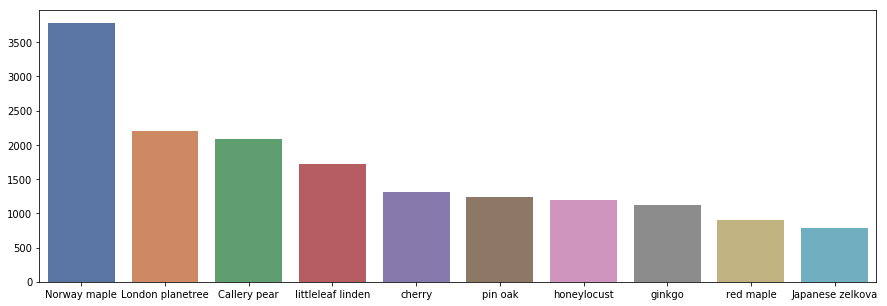

In [81]:
poor_10 = poor.spc_common.value_counts().nlargest(n=10)
plt.figure(figsize=(15,5))
sns.barplot(poor_10.index,poor_10.values,palette='deep')
plt.show()

#### Location

##### *Latitude & longitude*

In [24]:
#create folium map showing trees with health indicated by marker color (first 5,000 rows for easier processing)
ny_coord = (40.7128, -74.0060)
m1 = folium.Map(location=ny_coord, zoom_start=10,tiles="Stamen Terrain",width=1000,height=750)

for i,r in alive[:5000].iterrows():
    if r['health'] == 'Good':
        folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#6DB371",fill_color="#6DB371").add_to(m1)
    elif r['health'] == 'Fair':
        folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#EEF274",fill_color="#EEF274").add_to(m1)
    else:
        folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#F27474",fill_color="#F27474").add_to(m1)

m1

##### *Latitude & longitude - Good*

In [25]:
m2 = folium.Map(location=ny_coord, zoom_start=10,tiles="Stamen Terrain",width=1000,height=750)

for i,r in good[:5000].iterrows():
    folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#6DB371",fill_color="#6DB371").add_to(m2)
m2

##### *Latitude & longitude - Fair*

In [26]:
m3 = folium.Map(location=ny_coord, zoom_start=10,tiles="Stamen Terrain",width=1000,height=750)

for i,r in fair[:5000].iterrows():
    folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#EEF274",fill_color="#EEF274").add_to(m3)
m3

##### *Latitude & longitude - Poor*

In [27]:
m4 = folium.Map(location=ny_coord, zoom_start=10,tiles="Stamen Terrain",width=1000,height=750)

for i,r in poor[:5000].iterrows():
    folium.CircleMarker([r['Latitude'], r['longitude']],radius=3,popup=None,color="#F27474",fill_color="#F27474").add_to(m4)
m4

#### *Boro*

In [28]:
#create new dataframes for easily visualizing boro distributions
boro = alive.groupby(['boroname'])['tree_id'].count().reset_index(name='total_trees_boro')
boro_health = alive.groupby(['boroname', 'health'])['tree_id'].count().reset_index(name='total_trees')
boro_health = pd.merge(boro_health, boro, left_on='boroname',right_on='boroname',how='left')
boro_health['perc_total'] = boro_health['total_trees']/boro_health['total_trees_boro']
poor_boro = boro_health[boro_health['health']=='Poor']
fair_boro = boro_health[boro_health['health']=='Fair']
good_boro = boro_health[boro_health['health']=='Good']

Text(0.5, 1.0, 'Poor')

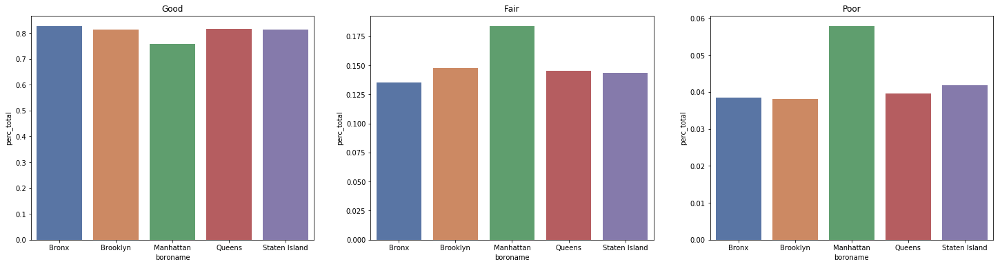

In [29]:
fig4, ax4 = plt.subplots(1,3,figsize=(25,6))
sns.barplot(x=good_boro['boroname'],y=good_boro['perc_total'],ax=ax4[0],palette='deep')
ax4[0].set_title('Good')
sns.barplot(x=fair_boro['boroname'],y=fair_boro['perc_total'],ax=ax4[1],palette='deep')
ax4[1].set_title('Fair')
sns.barplot(x=poor_boro['boroname'],y=poor_boro['perc_total'],ax=ax4[2],palette='deep')
ax4[2].set_title('Poor')

#### EDA summary
From exploring the dataset a bit more, we learned:

 - Stewardship and curb locations may not be huge factors, but guard might be
 - Health by species seems to be pretty different (at least looking at the top 10), so that could be a factor
 - Boro could be a factor (it seems Manhattan doesn't have the healthiest trees...)

### PREPARING DATA FOR THE MODEL
Given what we learned, we will want to prep our data a bit more prior to fitting our model

#### Dummying the columns

In [58]:
#create new dataframe that we'll use for our model
model_data = alive[['health','boroname','spc_common','guards','tree_problems','trunk_problems','branch_problems','root_problems']]

#dummify the categorical columns
model_data = pd.get_dummies(model_data, columns=['spc_common','guards','boroname'],drop_first=True)

In [59]:
model_data.shape

(652173, 143)

#### Dropping all null vals

In [60]:
model_data.dropna(inplace=True)

#### Modifying our response to be binary

In [62]:
model_data.replace({'Good': 1,'Fair':0,'Poor':0},inplace=True)

#### Setting our features and response

In [63]:
X = model_data.drop(columns=['health'])
y = model_data['health']

### MODELING THE DATA (WITH LOGISTIC REGRESSION)
Given the dataset's size and that we're trying to predict the class, a Logistic Regression model is naturally a solid choice for predicting tree health.

In [64]:
from sklearn.feature_selection import SelectPercentile
from sklearn.model_selection import train_test_split

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.5)

Dummifying the data increased the amount of columns dramatically, thus increasing the complexity of the model. As such, we're going to utilize automated feature selection to help reduce our feature columns. We can score both to see how it helped.

In [66]:
select = SelectPercentile(percentile=50)
select.fit(X_train, y_train)
X_train_selected = select.transform(X_train)
X_test_selected = select.transform(X_test)

In [67]:
X_train.shape

(326086, 142)

In [68]:
X_train_selected.shape

(326086, 71)

And now to fit the model with both...

In [69]:
from sklearn.linear_model import LogisticRegression

In [70]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
lr.score(X_test, y_test)

0.8120679820660808

In [71]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train_selected, y_train)
lr.score(X_train_selected, y_train)

0.8132977190066424

### CONCLUSION

Ok, so the automated feature selection *slightly* increases our accuracy, but either way, our model is pretty accurate, right?! Well...

In [75]:
len(model_data[model_data['health'] == 1])/len(model_data)

0.8109057119900885

Ah, right. Our scores only *slightly* beat the proportion of the majority class. If the model performed better, we would actually see score exceeding this proportion.

To improve our classifier, we could try different feature columns, adjust for the class imbalance, or try leaving our response as multi-nomial. Unfortunately, after trying each these (several times), I couldn't improve the score.

### NEXT STEPS?

At this point, joining in additional data sources should be explored. Additional features for the neighborhood/zip may be more telling. Things like:

 - crime rate
 - income
 - population
 - proximity to restaurants
 - average height of buildings